In [1]:
import numpy
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# import csv file
df = pd.read_csv(r'C:\Users\hp\Data Science\archive\Hackathon_Working_Data.csv', encoding= 'unicode_escape')

In [3]:
df.shape

(26985, 14)

In [4]:
df.head(100)


,MONTH,STORECODE,DAY,BILL_ID,BILL_AMT,QTY,VALUE,PRICE,GRP,SGRP,SSGRP,CMP,MBRD,BRD
0,M1,N1,4,T375,225.0,1.0,225.0,225.0,BUTTER MARGR (4/94),BUTTER,SALTED,G C M M F,AMUL,AMUL
1,M1,N1,4,T379,95.0,1.0,95.0,95.0,CONFECTIONERY - ECLAIRS,CONFECTIONERY - ECLAIRS,CONFECTIONERY - ECLAIRS,PARLE PRODS,MELODY,MELODY CHOCOLATY
2,M1,N1,4,T381,10.0,1.0,10.0,10.0,CHOCOLATE,CHOCOLATE PANNED,CHOCOLATE PANNED,MONDELEZ INTERNATIONAL,CADBURY SHOTS,CADBURY SHOTS
3,M1,N1,4,T382,108.0,1.0,108.0,108.0,PACKAGED TEA,MAIN PACKS,MAIN PACKS,GUJ TEA PROCESSORS,WAGH BAKRI,WAGH BAKRI INSTANT
4,M1,N1,4,T384,19.0,1.0,19.0,19.0,ALL IODISED SALT,POWDERED SALT,POWDERED SALT,TATA CHEM,TATA,TATA SALT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,M1,N1,4,T459,9.8,1.0,9.8,9.8,DETERGENT CAKES/BARS,DETERGENT CAKES/BARS,DETERGENT CAKES/BARS,SHIVANI DETERGENT PVT LTD,SARGAM,SARGAM
96,M1,N1,4,T460,39.0,1.0,39.0,39.0,TOILET SOAPS (04/00),PREMIUM,PREMIUM,GODREJ CONSUMER PRODS,GODREJ NO 1,GODREJ NO 1 ROSEWATER & ALMOND
97,M1,N1,4,T462,320.0,1.0,320.0,320.0,PACKAGED ATTA (1/95),ATTA,ATTA,SANGHVI FOODS PVT LTD,SILVER COIN,SILVER COIN
98,M1,N1,4,T463,20.0,1.0,20.0,20.0,BREAKFAST CEREALS,READY TO EAT CEREALS,KIDS,KELLOGG'S INDIA,KELLOGG'S KPAK,KELLOGG'S CHOCOS FILLS KPAK


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26985 entries, 0 to 26984
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   MONTH      26985 non-null  object 
 1   STORECODE  26985 non-null  object 
 2   DAY        26985 non-null  int64  
 3   BILL_ID    26985 non-null  object 
 4   BILL_AMT   26985 non-null  float64
 5   QTY        26985 non-null  float64
 6   VALUE      26985 non-null  float64
 7   PRICE      26985 non-null  float64
 8   GRP        26985 non-null  object 
 9   SGRP       26985 non-null  object 
 10  SSGRP      26985 non-null  object 
 11  CMP        26985 non-null  object 
 12  MBRD       26985 non-null  object 
 13  BRD        26985 non-null  object 
dtypes: float64(4), int64(1), object(9)
memory usage: 2.9+ MB


In [6]:
 pd.isnull(df)

,MONTH,STORECODE,DAY,BILL_ID,BILL_AMT,QTY,VALUE,PRICE,GRP,SGRP,SSGRP,CMP,MBRD,BRD
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26980,False,False,False,False,False,False,False,False,False,False,False,False,False,False
26981,False,False,False,False,False,False,False,False,False,False,False,False,False,False
26982,False,False,False,False,False,False,False,False,False,False,False,False,False,False
26983,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [7]:
# describe() method returns description of the data in the DataFrame (i.e. count, mean, std, etc)
df.describe()

,DAY,BILL_AMT,QTY,VALUE,PRICE
count,26985.000000,26985.000000,26985.000000,26985.000000,26985.000000
mean,15.167019,278.754206,4.105021,67.808551,52.812982
std,8.956057,541.398504,95.666947,118.005978,84.987730
min,1.000000,0.000000,0.500000,0.000000,0.000000
25%,7.000000,40.000000,1.000000,10.000000,10.000000
50%,14.000000,111.000000,1.000000,30.000000,22.000000
75%,23.000000,280.000000,2.000000,80.000000,64.000000
max,31.000000,7292.000000,12000.000000,3150.000000,3150.000000


In [8]:
df.columns

Index(['MONTH', 'STORECODE', 'DAY', 'BILL_ID', 'BILL_AMT', 'QTY', 'VALUE',
       'PRICE', 'GRP', 'SGRP', 'SSGRP', 'CMP', 'MBRD', 'BRD'],
      dtype='object')

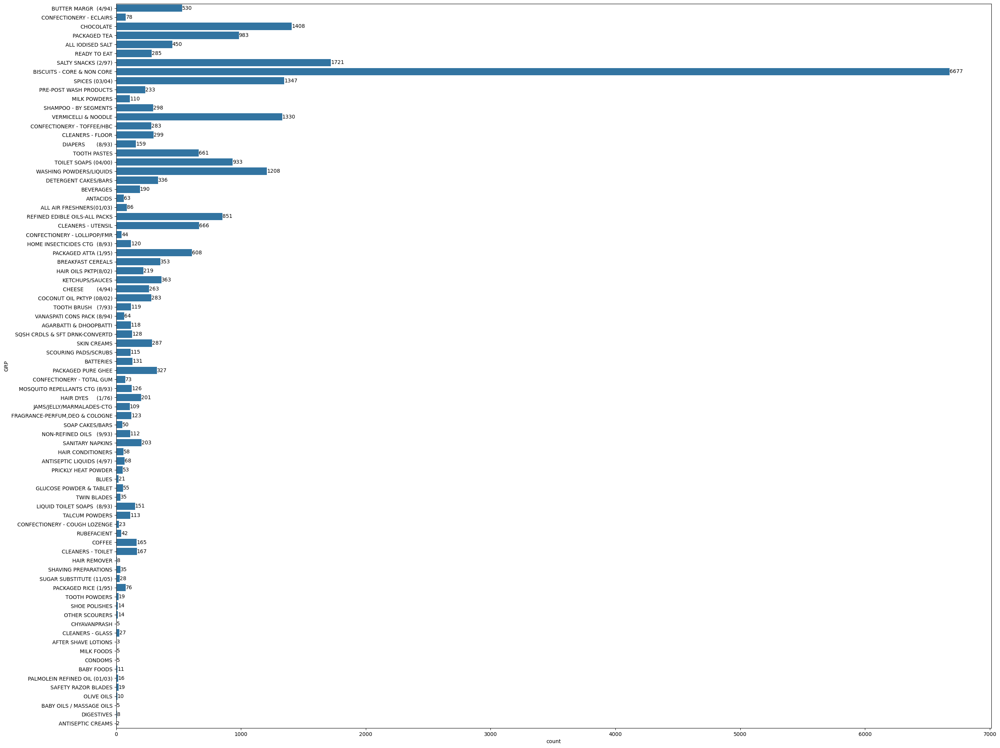

In [9]:
plt.figure(figsize=(30, 25))  # Adjust width and height as needed
ax = sns.countplot(y='GRP', data=df)
for bars in ax.containers:
    ax.bar_label(bars)

<Axes: xlabel='MONTH', ylabel='QTY'>

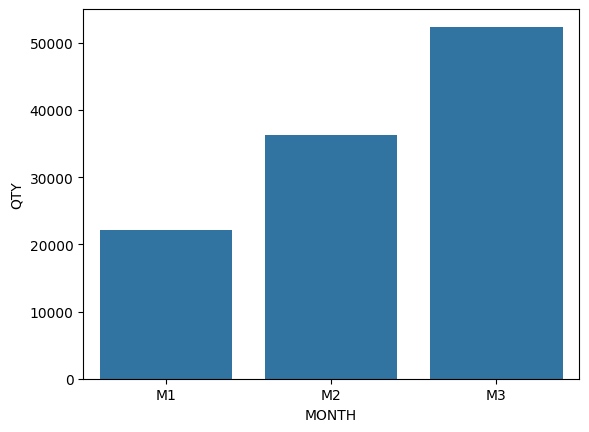

In [10]:
# Define the custom order of months
custom_order = ['M1', 'M2', 'M3']

# Convert the 'MONTH' column to categorical type with the custom order
df['MONTH'] = pd.Categorical(df['MONTH'], categories=custom_order, ordered=True)

# Group by 'MONTH' and sum the 'QTY' values
sales_gen = df.groupby('MONTH', as_index=False, observed=False)['QTY'].sum().sort_values(by='QTY', ascending=False)

# Plot the bar chart
sns.barplot(x='MONTH', y='QTY', data=sales_gen)

<Axes: xlabel='QTY', ylabel='GRP'>

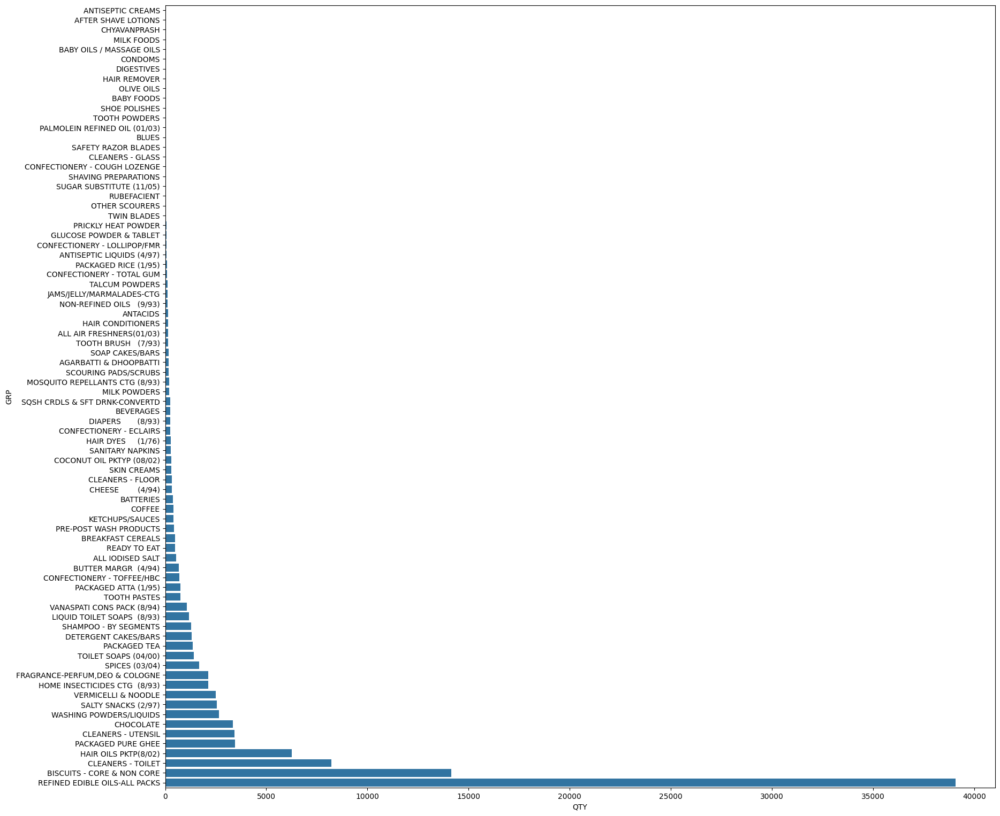

In [11]:
plt.figure(figsize=(20, 19))
a=df.groupby(['GRP'],as_index=False)['QTY'].sum().sort_values(by='QTY',ascending=True)
sns.barplot(x='QTY',y='GRP',data=a)

<Axes: xlabel='QTY', ylabel='SGRP'>

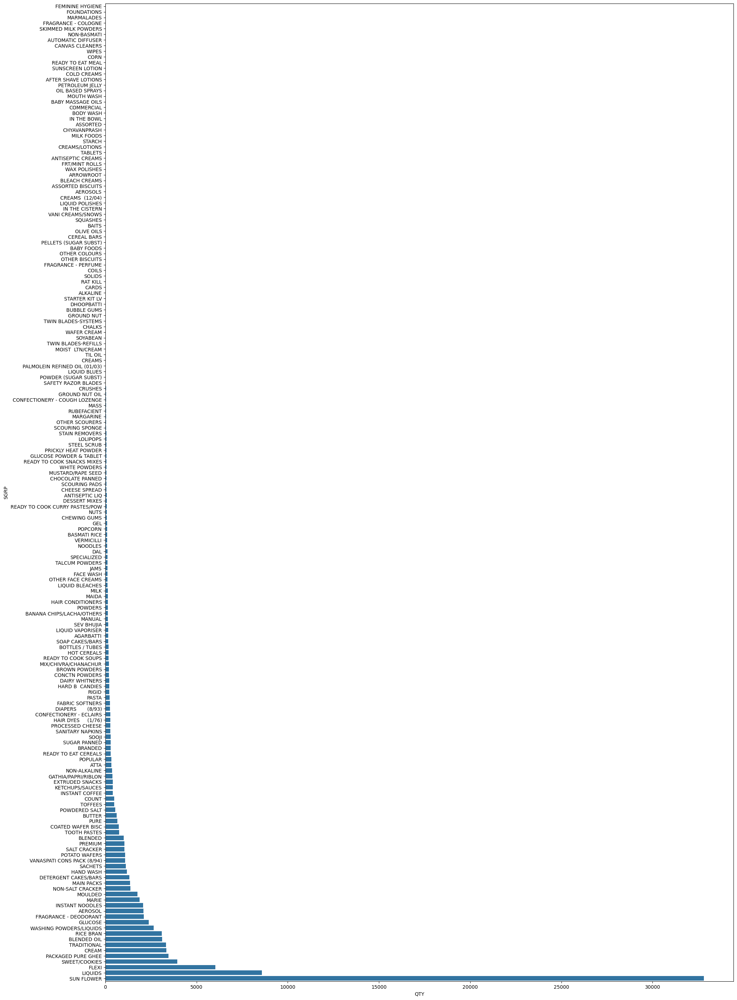

In [12]:
plt.figure(figsize=(23, 36))
a=df.groupby(['SGRP'],as_index=False)['QTY'].sum().sort_values(by='QTY',ascending=True)
sns.barplot(x='QTY',y='SGRP',data=a)

In [13]:
plt.figure(figsize=(50, 190))
# Create the plot
a = df.groupby(['BRD'], as_index=False)['QTY'].sum().sort_values(by='QTY', ascending=True)
sns.barplot(x='QTY', y='BRD', data=a)

<Axes: xlabel='QTY', ylabel='BRD'>

C:\Users\hp\AppData\Local\Temp\ipykernel_20280\981180982.py:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_df = df.pivot_table(index='MONTH', columns='GRP', values='QTY', aggfunc='sum')


Text(0.5, 1.0, 'Stacked Bar Plot of Quantity by Month and Product Group (GRP)')

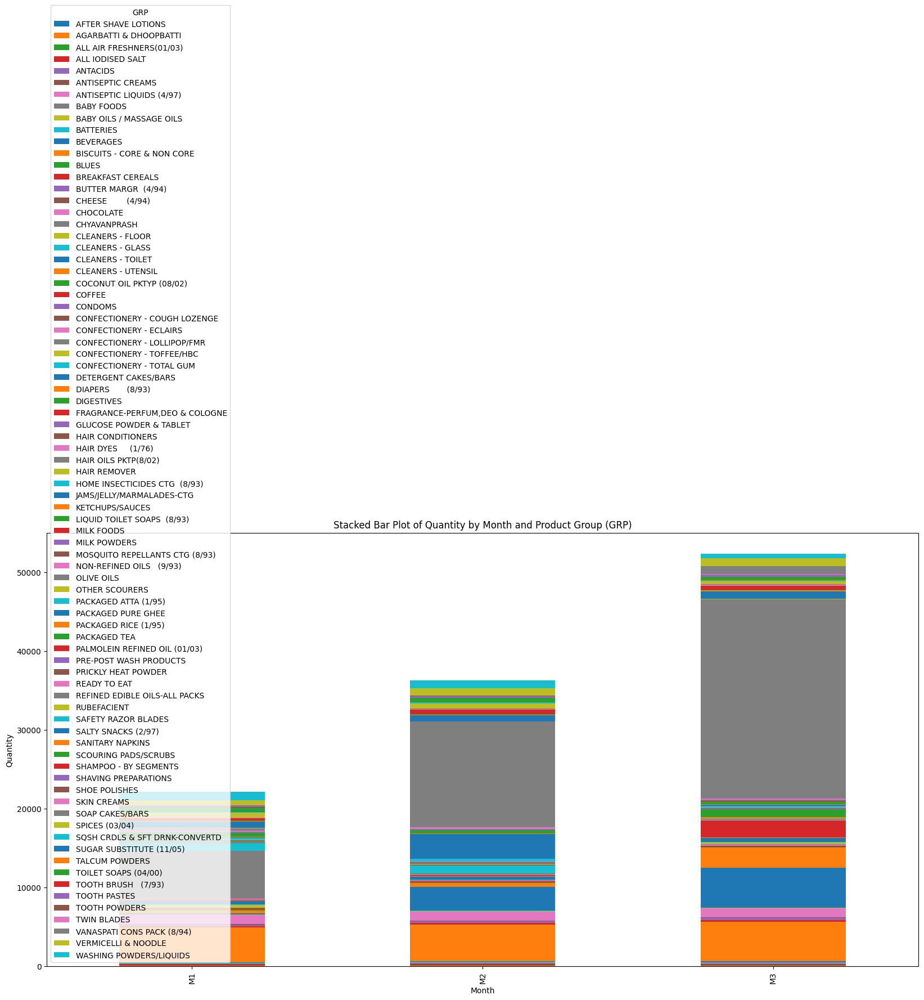

In [14]:
# Pivot the data
pivot_df = df.pivot_table(index='MONTH', columns='GRP', values='QTY', aggfunc='sum')

# Plot the stacked bar plot
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(20, 10))

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Quantity')
plt.title('Stacked Bar Plot of Quantity by Month and Product Group (GRP)')

C:\Users\hp\AppData\Local\Temp\ipykernel_20280\2741356374.py:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_df = df.pivot_table(index='MONTH', columns='BRD', values='QTY', aggfunc='sum')


Text(0.5, 1.0, 'Stacked Bar Plot of Quantity by Month and Product Brand (BRD)')

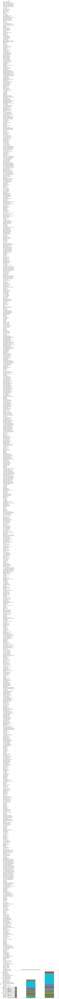

In [15]:
# Pivot the data
pivot_df = df.pivot_table(index='MONTH', columns='BRD', values='QTY', aggfunc='sum')

# Plot the stacked bar plot
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(20, 10), xticks=[])

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Quantity')
plt.title('Stacked Bar Plot of Quantity by Month and Product Brand (BRD)')

(-1.0999986208122603,
 1.0999999343231448,
 -1.099999999919676,
 1.0999999999961587)

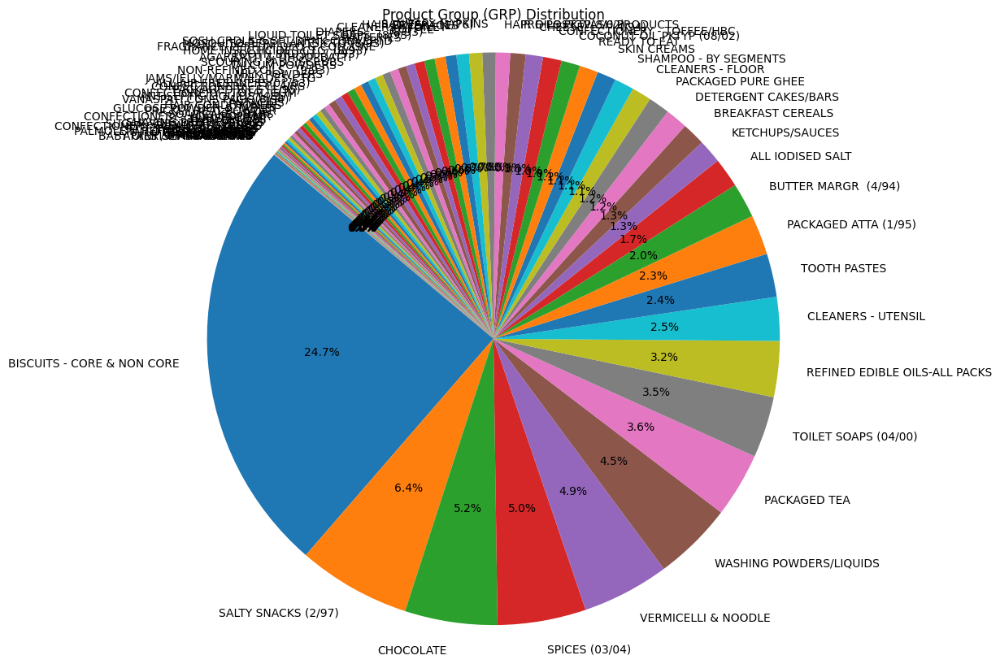

In [16]:
grp_counts = df['GRP'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(10, 10))
plt.pie(grp_counts, labels=grp_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Product Group (GRP) Distribution')
plt.axis('equal')

(-1.0999999999857404,
 1.0999999999993209,
 -1.0999999999999925,
 1.0999999999999999)

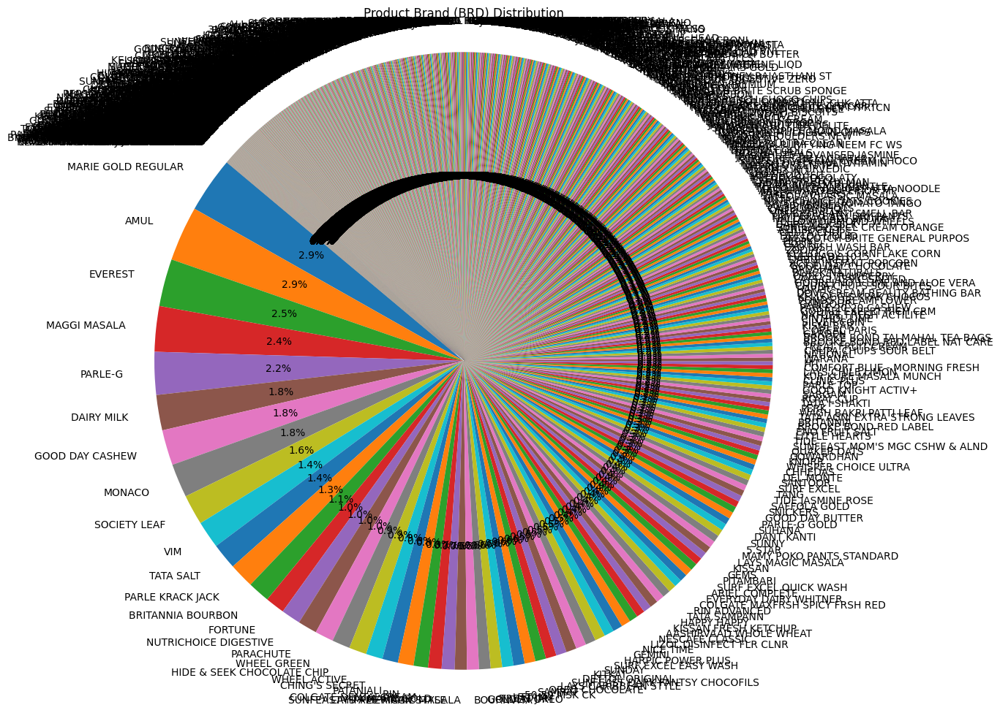

In [17]:
grp_counts = df['BRD'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(12, 12))
plt.pie(grp_counts, labels=grp_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Product Brand (BRD) Distribution')
plt.axis('equal')

In [ ]:
# Extract these columns for analysis
columns_of_interest = ['QTY', 'GRP', 'BRD', 'STORECODE']
data_subset = df[columns_of_interest]

# One-hot encode categorical variables
data_subset = pd.get_dummies(data_subset, columns=['GRP', 'BRD', 'STORECODE'])

# Calculate the correlation matrix
correlation_matrix = data_subset.corr()

# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')